In [1]:
import subprocess
import os
import sys

import matplotlib.backends.backend_pdf
import scanpy as sc
import matplotlib.pyplot as pl
import anndata as ad
import pandas as pd
import numpy as np
import seaborn as sns
import scvelo as scv
scv.settings.verbosity=1

# Jupyter stuff
from tqdm.notebook import tqdm
from IPython.display import clear_output
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
%matplotlib inline

# Custom functions
sys.path.insert(1, '../..')
from utils import *

In [2]:
sys.path.insert(1, '/fast/work/users/peidlis_c/utils/single_cell_rna_seq/scrnaseq_utils/')
# sys.path.insert(1, '/extra/stefan/utils/scrnaseq_utils/')
from scrnaseq_util_functions import *
data_path = '/fast/work/users/peidlis_c/data/perturbation_resource_paper/'

In [3]:
data_path = '/fast/work/users/peidlis_c/data/perturbation_resource_paper/'


h5_files = {}
for path, subdirs, files in os.walk(data_path):
    for name in files:
        if '.h5' in name: h5_files[name[:-3]] = os.path.join(path, name)
for k in ['exampledataset', 'NormanWeissman2019_raw']:
    if k in h5_files.keys(): del h5_files[k]
for k in ['PapalexiSatija2021_eccite_arrayed_protein', 'PapalexiSatija2021_eccite_protein', 'FrangiehIzar2021_protein']:
    if k in h5_files.keys(): del h5_files[k]
for k in ['gene_scores', 'ChromVar', 'LSI_embedding', 'markerpeak_target', 'peak_bc']:
    if k in h5_files.keys(): del h5_files[k]

print(len(h5_files))
list(h5_files.keys())

35


['PapalexiSatija2021_eccite_arrayed_RNA',
 'PapalexiSatija2021_eccite_RNA',
 'TianKampmann2021_CRISPRa',
 'TianKampmann2021_CRISPRi',
 'XieHon2017',
 'AissaBenevolenskaya2021',
 'McFarlandTshemiak2020_all_expts_combined',
 'GasperiniShendure2019_lowMOI',
 'GasperiniShendure2019_atscale',
 'GasperiniShendure2019_highMOI',
 'ZhaoSims2021',
 'DixitRegev2016',
 'DatlingerBock2017',
 'DatlingerBock2021',
 'FrangiehIzar2021_RNA',
 'WeinrebKlein2020',
 'ShifrutMarson2018',
 'ReplogleWeissman2022_K562_essential',
 'ReplogleWeissman2022_K562_gwps',
 'ReplogleWeissman2022_rpe1',
 'ChangYe2021',
 'GehringPachter2019',
 'SchiebingerLander2019_GSE115943',
 'SchiebingerLander2019_GSE106340',
 'NormanWeissman2019_filtered',
 'SchraivogelSteinmetz2020_TAP_SCREEN__chromosome_11_screen',
 'SchraivogelSteinmetz2020_TAP_SCREEN__chromosome_8_screen',
 'AdamsonWeissman2016_GSM2406677_10X005',
 'AdamsonWeissman2016_GSM2406681_10X010',
 'AdamsonWeissman2016_GSM2406675_10X001',
 'SrivatsanTrapnell2020_sciplex2

In [51]:
def process_tab(tab, mode):
    if mode == 'simple_confusion':
        tab = pd.DataFrame(zscore(tab.values, axis=0), tab.index, tab.columns)
        tab = 0.5 * (tab+tab.T)
    elif 'distance' in mode:
        tab = 1/tab
        tab.fillna(0)
        tab[tab==np.infty] = 0
    try:
        tab=cluster_matrix(tab, 'both')
    except:
        pass
    return tab
        

def plot_heatmap(tab, title, ax):
    cmap = sns.cm.rocket
    cmap.set_bad('grey',1.)
    sns.heatmap(tab, robust=True, ax=ax, cmap=cmap)
    ax.set_xticks(np.arange(len(tab))+.5)
    ax.set_xticklabels(tab.index, fontsize=6)
    ax.set_yticks(np.arange(len(tab))+.5)
    ax.set_yticklabels(tab.index, fontsize=6)
    ax.set_title(title)

In [11]:
ttab = pd.read_excel('./analysis_screens/tessa_results/notes_on_scanvi_runs.xlsx', sheet_name=0, index_col=0)
tres = get_subfolders('./analysis_screens/tessa_results/', False)

# Demonstrative similarities

In [7]:
modes=['simple_confusion', 'graph_entropy', 'pairwise_pca_distances', 'pseudobulk_distances', 'pseudobulk_correlations']

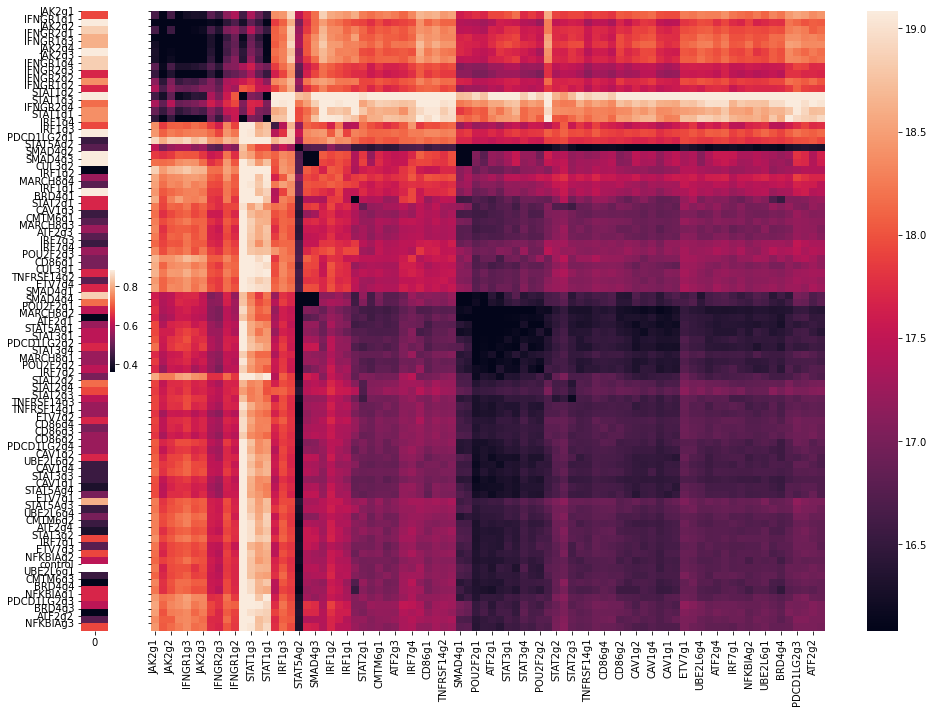

In [8]:
mode = 'pairwise_pca_distances'
key = 'PapalexiSatija2021_eccite_RNA'

tab = pd.read_csv(f'./analysis_screens/tables/{mode}_{key}_tables.csv', index_col=0)
df = pd.read_excel('labooc.xlsx', sheet_name=key[:31], index_col=0)

tab = cluster_matrix(tab, 'both')

df.loc['control'] = None
df = 1-df.loc[tab.index]

fig, axs = pl.subplots(1,2, sharey=True, figsize= [14,10], gridspec_kw={'width_ratios': [0.2, 5]})
ax = axs[0]
sns.heatmap(data=df, ax=ax, robust=True)


ax = axs[1]
sns.heatmap(data=tab, ax=ax, robust=True)
ax.set_yticks(np.arange(len(tab)))
ax.set_yticklabels(tab.index, fontsize=5)

pl.tight_layout()
pl.show()

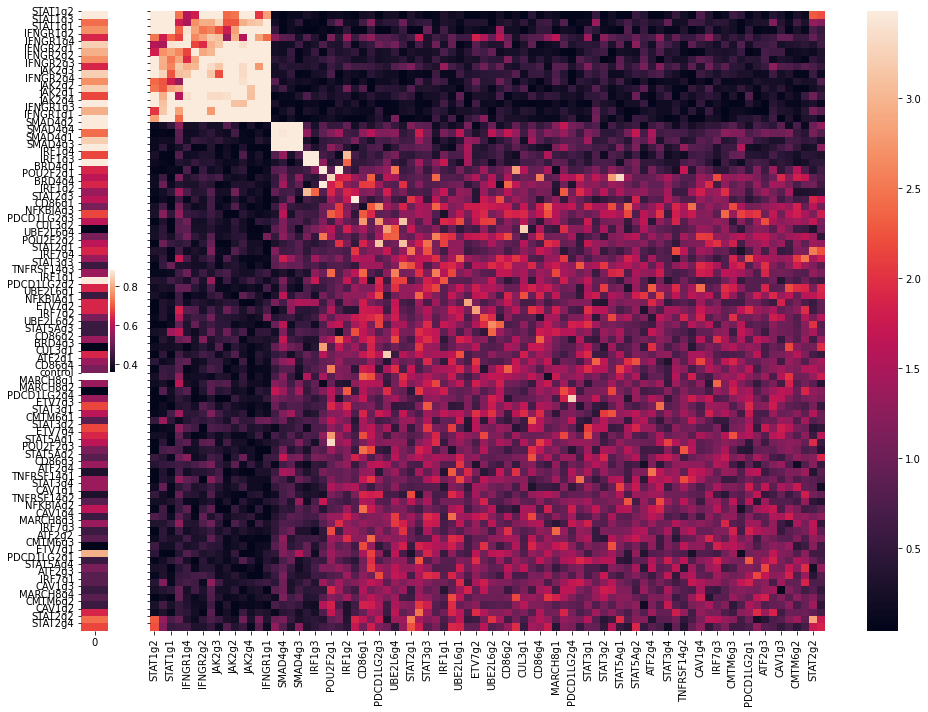

In [252]:
key = 'PapalexiSatija2021_eccite_RNA'

tab = pd.read_csv(f'./analysis_screens/tables/{mode}_{key}_tables.csv', index_col=0)
df = pd.read_excel('labooc.xlsx', sheet_name=key[:31], index_col=0)

df.loc['control'] = None
df = 1-df.loc[tab.index]

fig, axs = pl.subplots(1,2, sharey=True, figsize= [14,10], gridspec_kw={'width_ratios': [0.2, 5]})
ax = axs[0]
sns.heatmap(data=df, ax=ax, robust=True)


ax = axs[1]
sns.heatmap(data=tab, ax=ax, robust=True)
ax.set_yticks(np.arange(len(tab)))
ax.set_yticklabels(tab.index, fontsize=5)

pl.tight_layout()
pl.show()

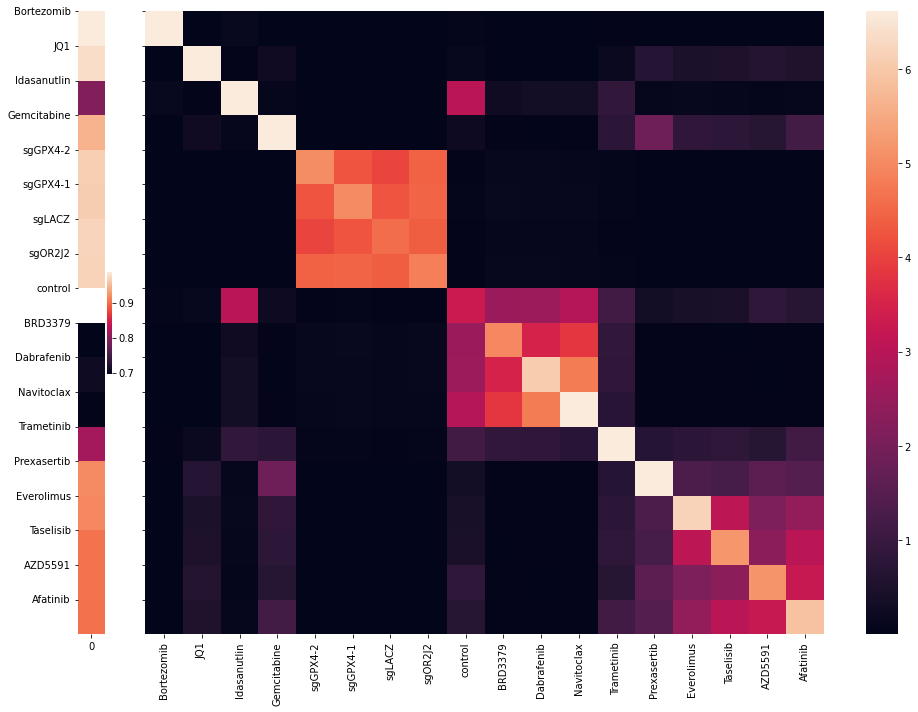

In [253]:
mode = 'graph_entropy'  # 'looc_confusion'
key = 'McFarlandTshemiak2020_all_expts_combined'

tab = pd.read_csv(f'./analysis_screens/tables/{mode}_{key}_tables.csv', index_col=0)
df = pd.read_excel('labooc.xlsx', sheet_name=key[:31], index_col=0)

df.loc['control'] = None
df = 1-df.loc[tab.index]

fig, axs = pl.subplots(1,2, sharey=True, figsize= [14,10], gridspec_kw={'width_ratios': [0.2, 5]})
ax = axs[0]
sns.heatmap(data=df, ax=ax, robust=True)


ax = axs[1]
sns.heatmap(data=tab, ax=ax, robust=True)
ax.set_yticks(np.arange(len(tab)))
ax.set_yticklabels(tab.index, fontsize=5)

pl.tight_layout()
pl.show()

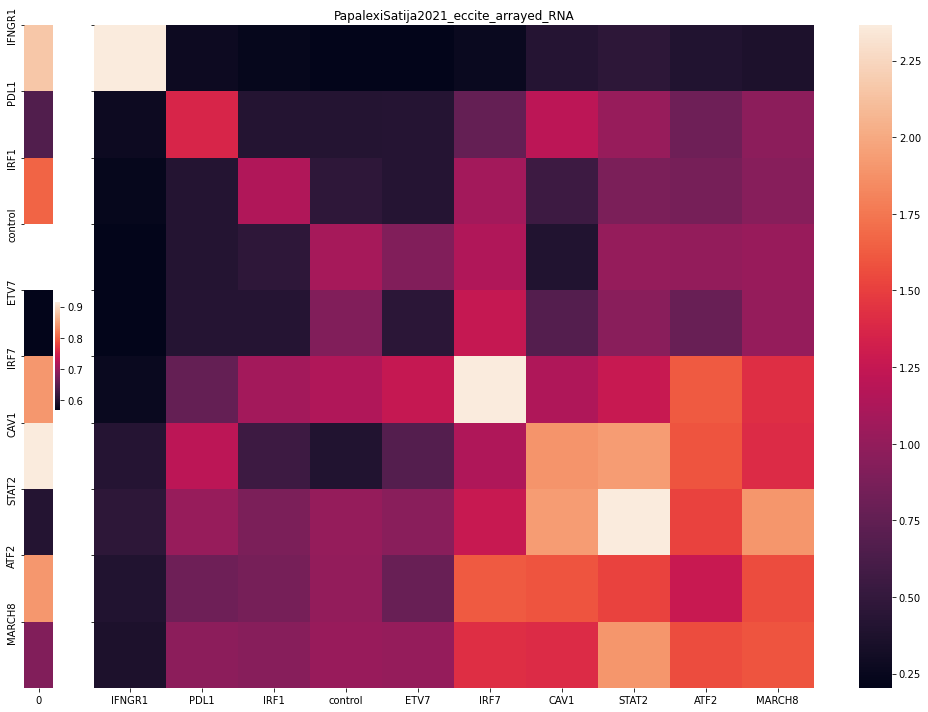

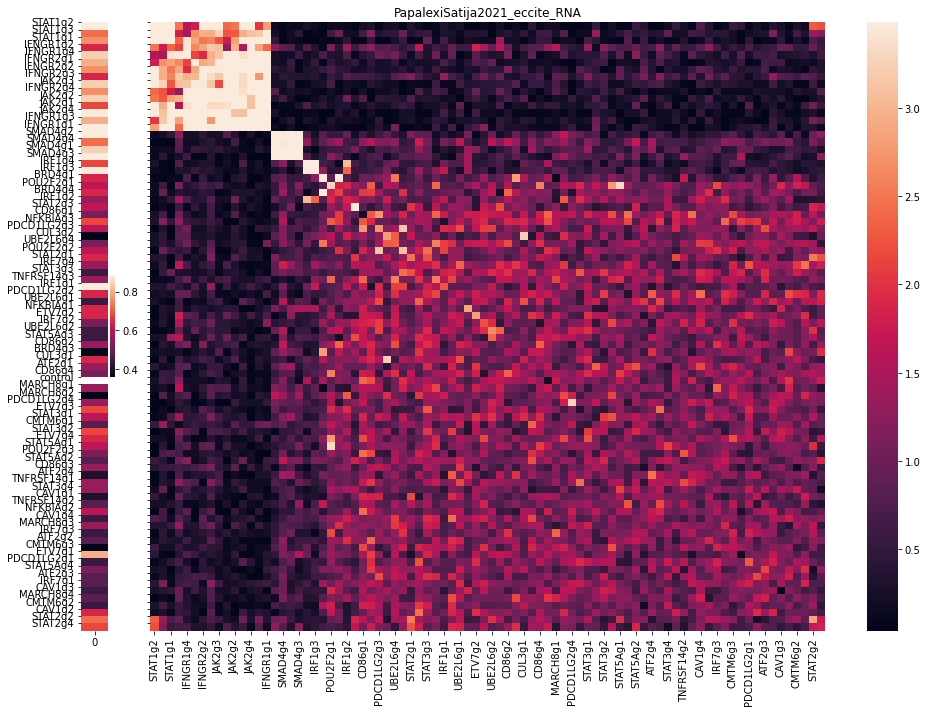

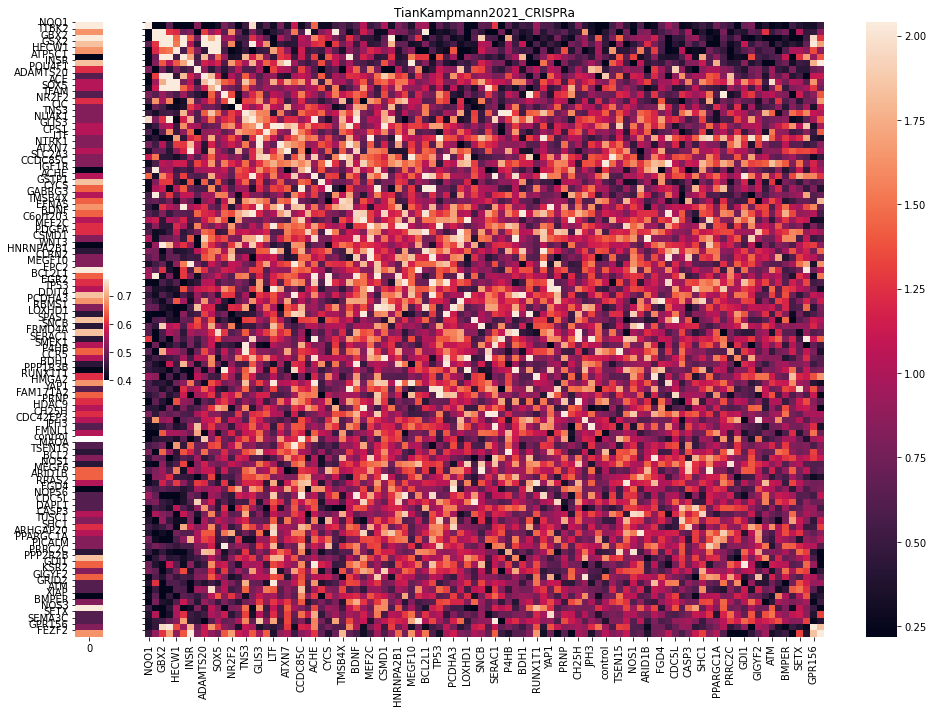

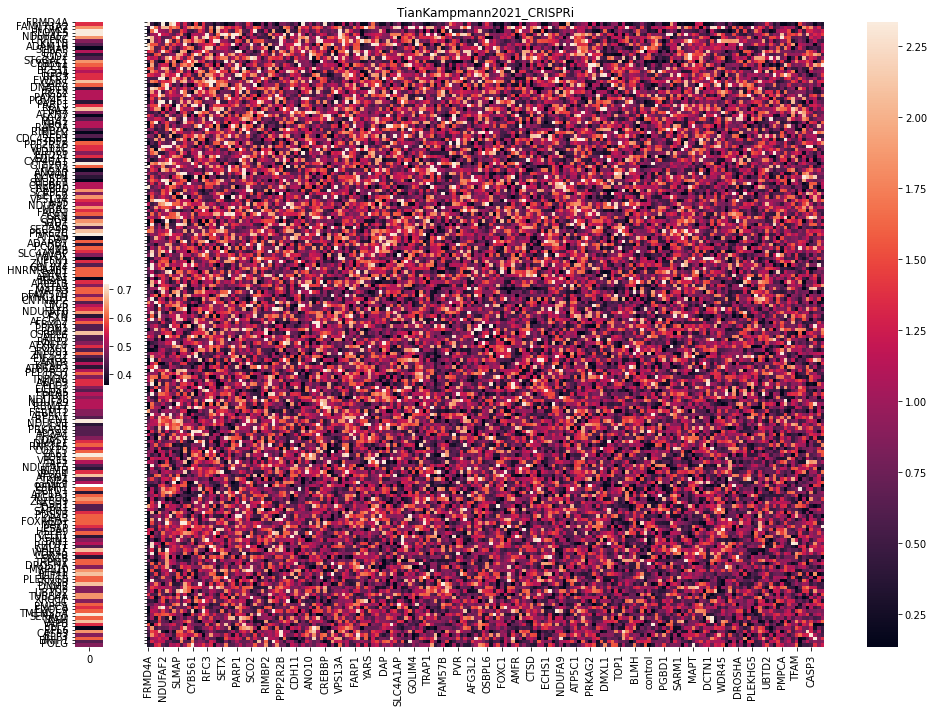

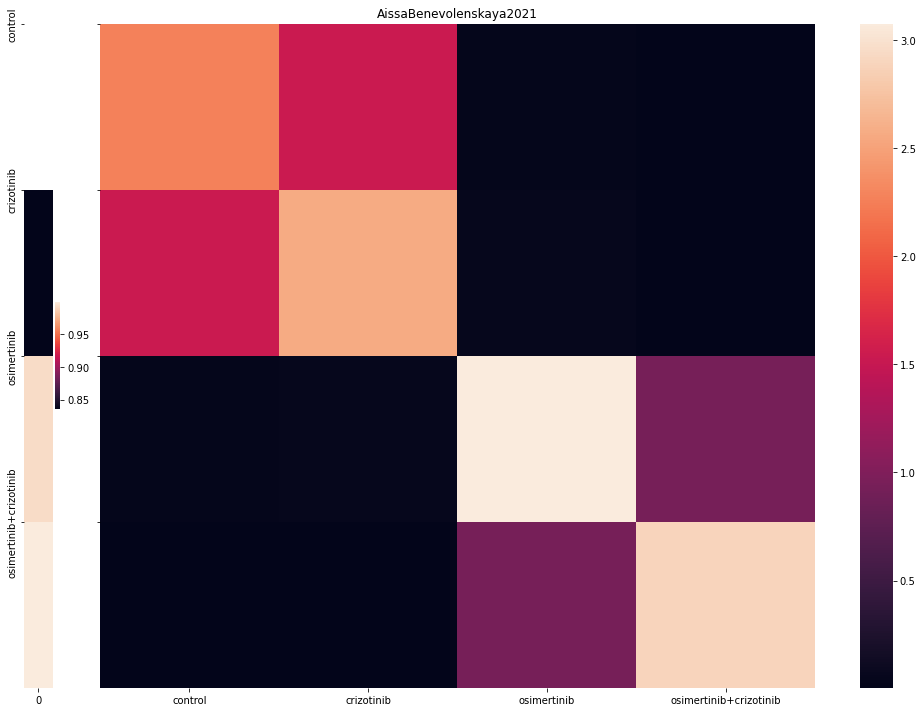

...

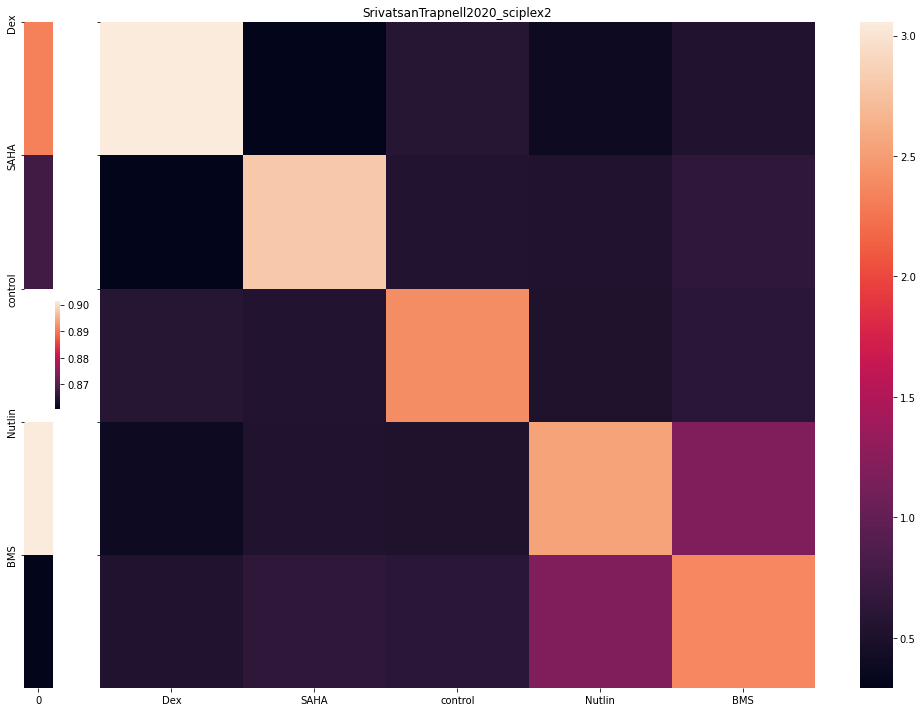

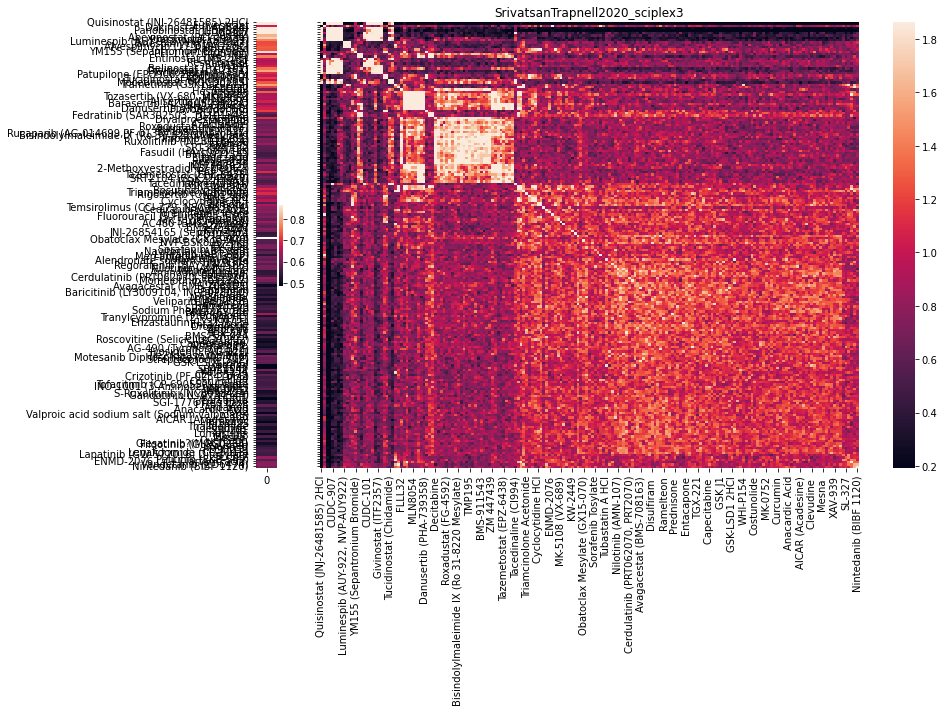

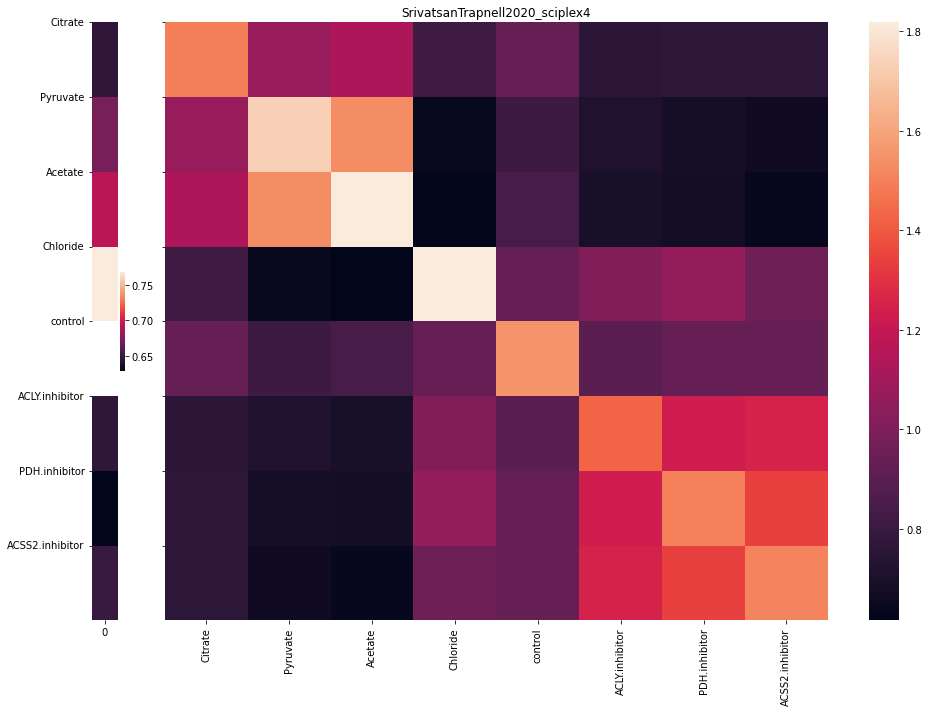

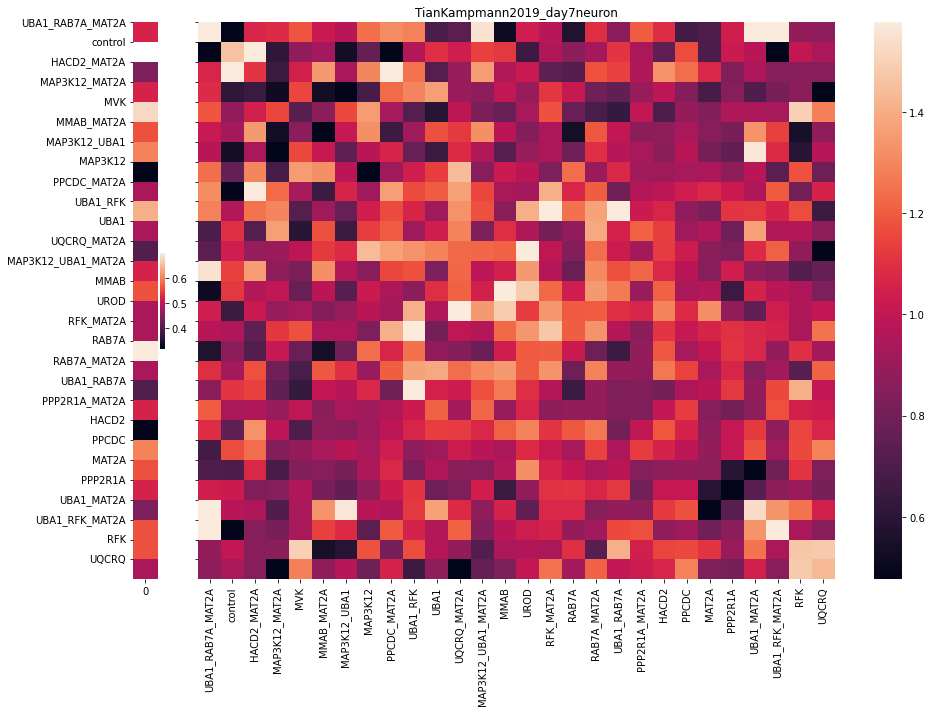

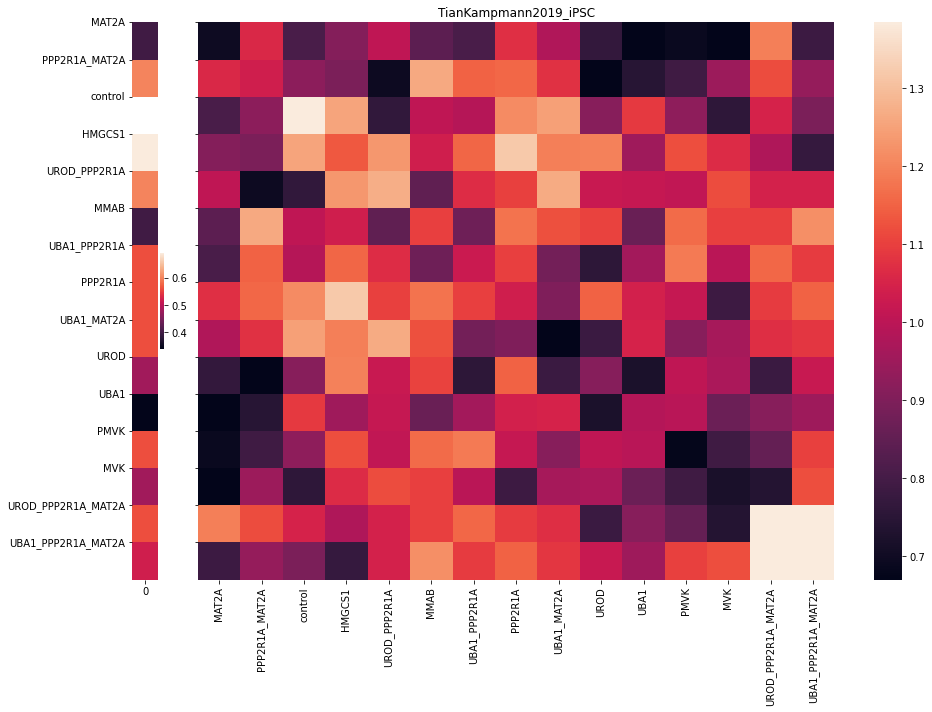

In [254]:
for key in h5_files.keys():
    mode = 'graph_entropy'  # 'looc_confusion'
    #     key = 'McFarlandTshemiak2020_all_expts_combined'
    try:
        tab = pd.read_csv(f'./analysis_screens/tables/{mode}_{key}_tables.csv', index_col=0)
        df = pd.read_excel('labooc.xlsx', sheet_name=key[:31], index_col=0)

        df.loc['control'] = None
        df = 1-df.loc[tab.index]

        fig, axs = pl.subplots(1,2, sharey=True, figsize= [14,10], gridspec_kw={'width_ratios': [0.2, 5]})
        ax = axs[0]
        sns.heatmap(data=df, ax=ax, robust=True)


        ax = axs[1]
        sns.heatmap(data=tab, ax=ax, robust=True)
        ax.set_yticks(np.arange(len(tab)))
        ax.set_yticklabels(tab.index, fontsize=5)
        ax.set_title(key)

        pl.tight_layout()
        pl.show()
    except:
        pass

# Aggregation

In [35]:
#looks really cool for 
cool_ones = ['PapalexiSatija2021_eccite_RNA', 'PapalexiSatija2021_eccite_arrayed_RNA', 'TianKampmann2021_CRISPRa', 'TianKampmann2021_CRISPRi', 'NormanWeissman2019_filtered',
             'McFarlandTshemiak2020_all_expts_combined', 'DixitRegev2016', 'DatlingerBock2017', 'FrangiehIzar2021_RNA', 'ShifrutMarson2018', 'ZhaoSims2021', 
             'AdamsonWeissman2016_GSM2406677_10X005', 'AdamsonWeissman2016_GSM2406681_10X010', 'SrivatsanTrapnell2020_sciplex3', 'SrivatsanTrapnell2020_sciplex4']

  0%|          | 0/15 [00:00<?, ?it/s]

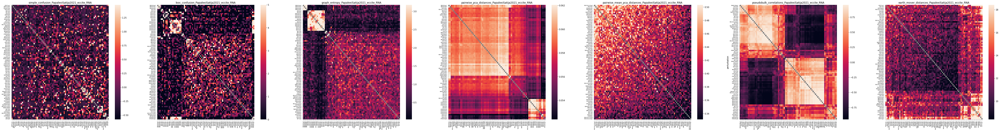

  7%|▋         | 1/15 [00:21<05:03, 21.66s/it]

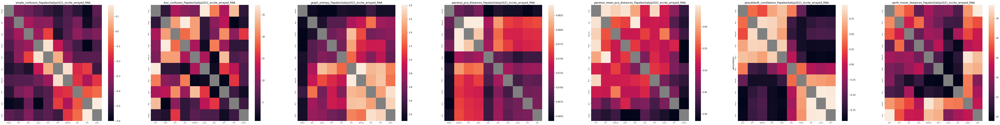

 13%|█▎        | 2/15 [00:24<02:16, 10.50s/it]

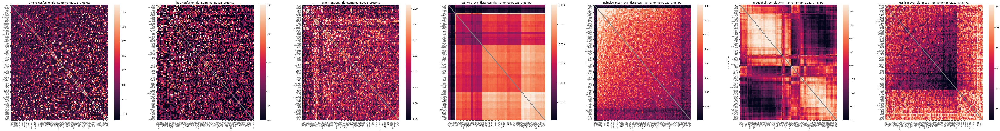

 20%|██        | 3/15 [00:48<03:22, 16.90s/it]

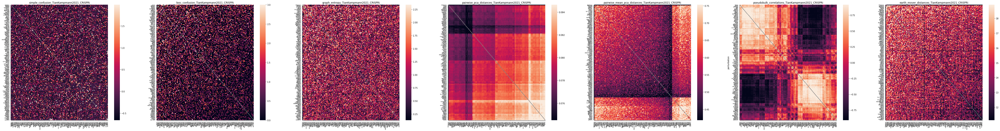

 27%|██▋       | 4/15 [01:47<06:06, 33.30s/it]

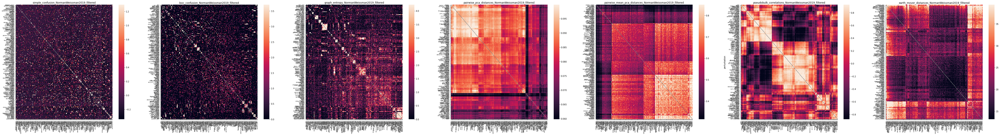

 33%|███▎      | 5/15 [03:13<08:42, 52.27s/it]

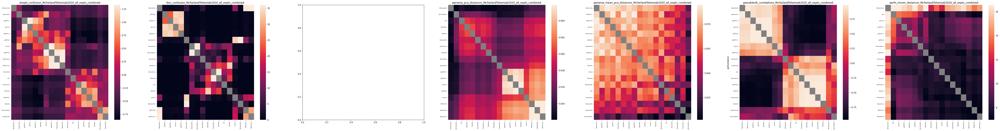

 40%|████      | 6/15 [03:17<05:22, 35.80s/it]

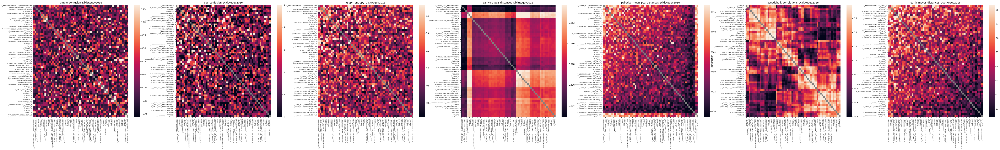

 47%|████▋     | 7/15 [03:34<03:57, 29.67s/it]

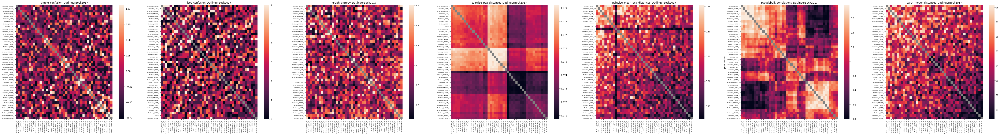

 53%|█████▎    | 8/15 [03:43<02:42, 23.14s/it]

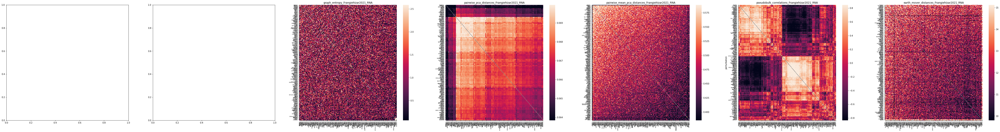

 60%|██████    | 9/15 [04:45<03:31, 35.26s/it]

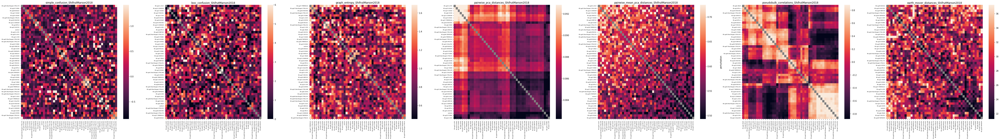

 67%|██████▋   | 10/15 [04:55<02:17, 27.48s/it]

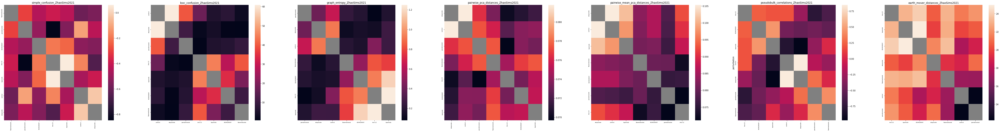

 73%|███████▎  | 11/15 [04:57<01:19, 19.79s/it]

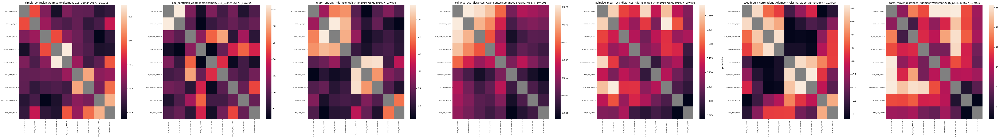

 80%|████████  | 12/15 [05:00<00:43, 14.61s/it]

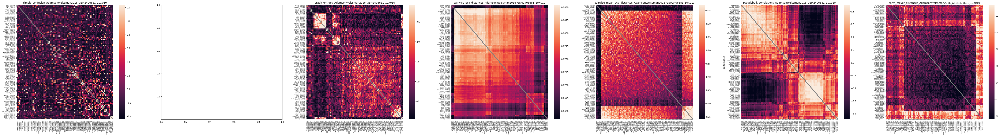

 87%|████████▋ | 13/15 [05:23<00:34, 17.21s/it]

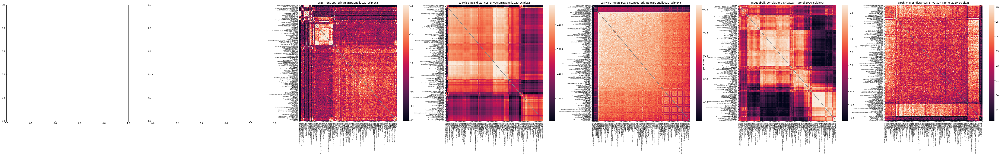

 93%|█████████▎| 14/15 [06:08<00:25, 25.69s/it]

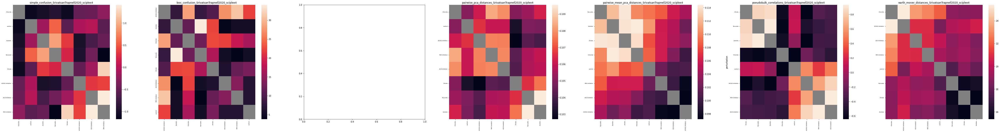

100%|██████████| 15/15 [06:11<00:00, 24.76s/it]


In [53]:
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('analysis_screens/aggregated_results.pdf') as pdf:
    modes=['simple_confusion', 'looc_confusion', 'graph_entropy', 'pairwise_pca_distances', 'pairwise_mean_pca_distances', 'pseudobulk_correlations', 'earth_mover_distances'] 
    N = len(modes)
    for key in tqdm(cool_ones):
        fig, axs = pl.subplots(1,N, figsize=[12*N, 10], sharex=False, sharey=False)
        for mode, ax in zip(modes, axs):
            instance = f'{mode}_{key}'
            file = f'./analysis_screens/tables/{instance}_tables.csv'
            if os.path.exists(file):
                tab = pd.read_csv(file, index_col=0)
                tab = process_tab(tab, mode)
                np.fill_diagonal(tab.values, None)
                plot_heatmap(tab, instance, ax)
        pdf.savefig()
        pl.show()

# Similarity of split classes

In [147]:
modes=['simple_confusion', 'graph_entropy', 'pairwise_pca_distances', 'pseudobulk_distances', 'pseudobulk_correlations']

FileNotFoundError: [Errno 2] No such file or directory: './analysis_screens/tables/split_simple_confusion_NormanWeissman2019_filtered_tables.csv'

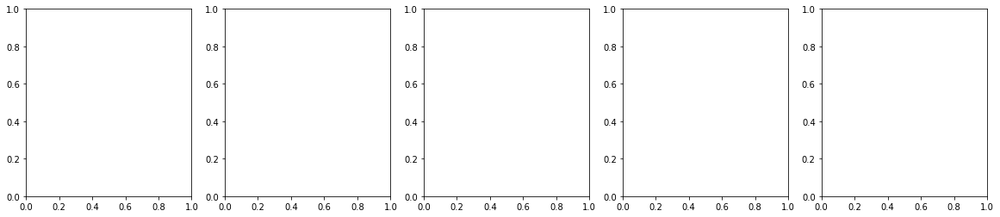

In [148]:
N = len(modes)
fig, axs = pl.subplots(1,N,figsize=[4*N, 4])
tabs = {}
for ax, mode in zip(axs, modes):
    key = 'NormanWeissman2019_filtered'  # AdamsonWeissman2016_GSM2406681_10X010
    sim = pd.read_csv(f'./analysis_screens/tables/split_{mode}_{key}_tables.csv', index_col=0)
    
    classes = pd.unique([x.replace('_X', '') for x in sim.index])
    res = {}
    for c in classes:
        res[c] = [sim.loc[c, c+'_X'], np.mean([sim.loc[c, c], sim.loc[c+'_X', c+'_X']])]
    df = pd.DataFrame(res, index=['split', 'self']).T
    
    sns.scatterplot(data=df, x='split', y='self', ax=ax)
    m = np.max(df.values)
    ax.plot([0,m], [0,m], c='k')
    ax.set_title(mode)
    ax.set_ylabel('Similarity to self')
    ax.set_xlabel('Similarity to split')
pl.suptitle('How similar are cells of the same class (split) vs how similar are cells with the same label AND class (self)')
pl.tight_layout()
pl.show()

In [149]:
sub = ['PapalexiSatija2021_eccite_RNA', 'McFarlandTshemiak2020_all_expts_combined', 'ZhaoSims2021', 
 'DixitRegev2016', 'DatlingerBock2017', 'DatlingerBock2021', 'NormanWeissman2019_filtered',
 'SchraivogelSteinmetz2020_TAP_SCREEN__chromosome_11_screen', 'AdamsonWeissman2016_GSM2406681_10X010']

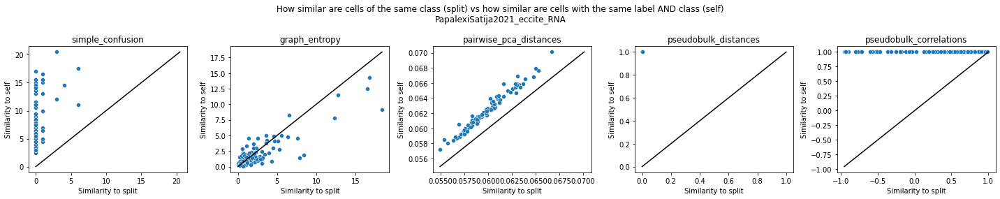

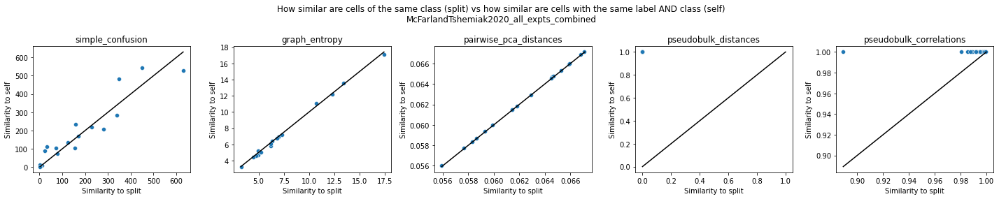

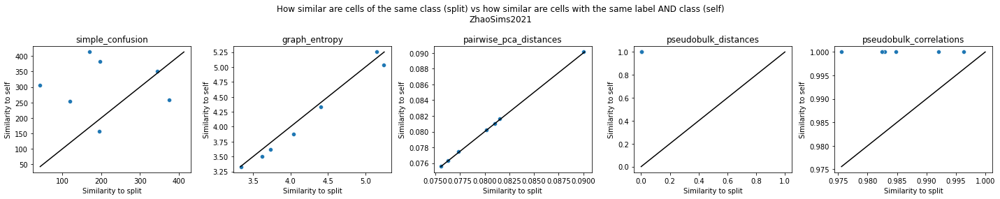

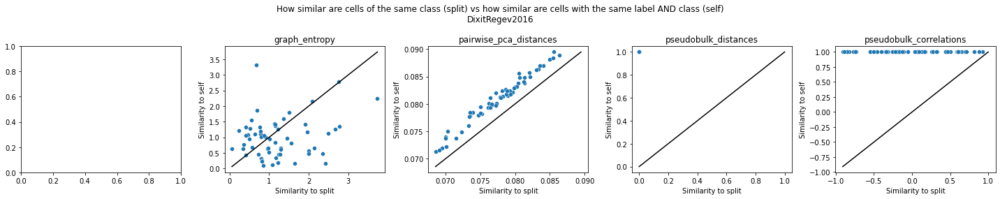

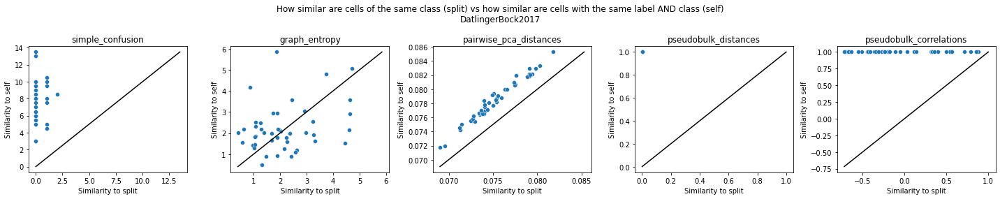

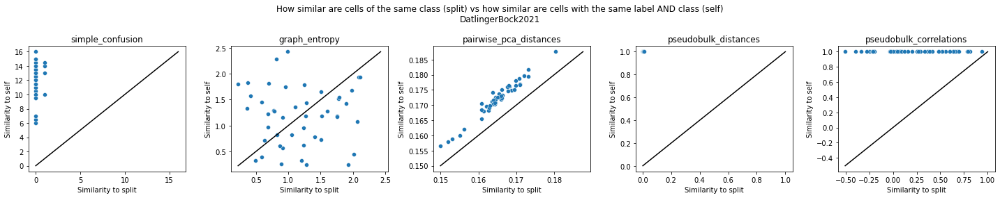

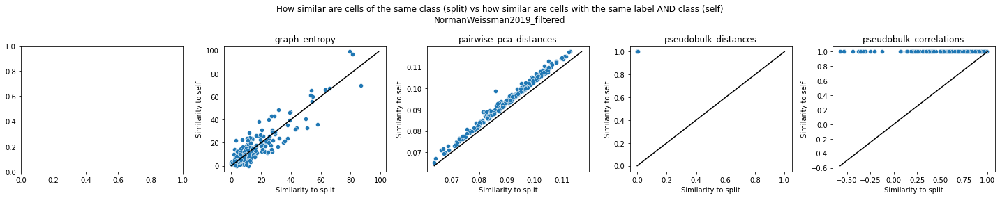

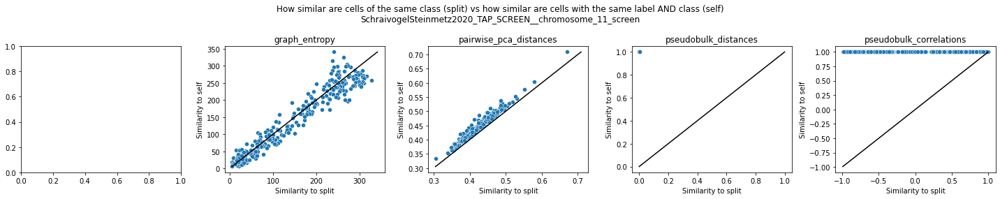

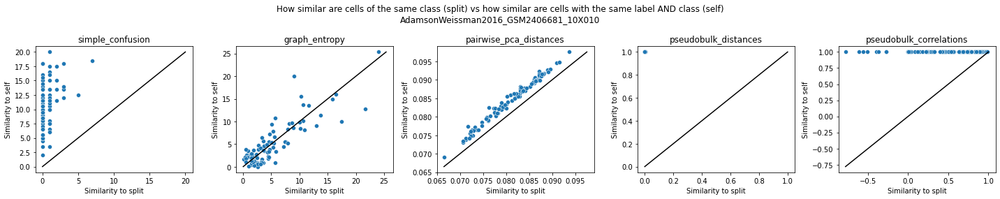

In [32]:
N = len(modes)
for key in sub:#h5_files.keys():
    fig, axs = pl.subplots(1,N,figsize=[4*N, 4])
    tabs = {}
    for ax, mode in zip(axs, modes):
        try:
            sim = pd.read_csv(f'./analysis_screens/tables/split_{mode}_{key}_tables.csv', index_col=0)
            classes = pd.unique([x.replace('_X', '') for x in sim.index])
        except:
            continue
        res = {}
        for c in classes:
            if False:#mode=='pairwise_pca_distances':
                N = len(classes)
                res[c] = [sim.loc[c, c+'_X'], np.sum([sim.loc[c, c], sim.loc[c+'_X', c+'_X']])/ (N*N-N)]
            else:
                res[c] = [sim.loc[c, c+'_X'], np.mean([sim.loc[c, c], sim.loc[c+'_X', c+'_X']])]
        df = pd.DataFrame(res, index=['split', 'self']).T

        sns.scatterplot(data=df, x='split', y='self', ax=ax)
        m = np.max(df.values)
        n = np.min(df.values)
        ax.plot([n,m], [n,m], c='k')
        ax.set_title(f'{mode}')
        ax.set_ylabel('Similarity to self')
        ax.set_xlabel('Similarity to split')
    pl.suptitle(f'How similar are cells of the same class (split) vs how similar are cells with the same label AND class (self)\n{key}')
    pl.tight_layout()
    pl.show()

In [127]:
mode = 'pseudobulk_distances'  # graph_entropy
sim = pd.read_csv(f'./analysis_screens/tables/split_{mode}_AdamsonWeissman2016_GSM2406681_10X010_tables.csv', index_col=0)

classes = pd.unique([x.replace('_X', '') for x in sim.index])
res = {}
for c in classes:
    res[c] = [sim.loc[c, c+'_X']*1000, np.mean([sim.loc[c, c], sim.loc[c+'_X', c+'_X']])]
df = pd.DataFrame(res, index=['split', 'self']).T

In [128]:
df

,split,self
PSMD4_pDS488,0.290993,1.0
CAD_pDS468,0.354999,1.0
TTI1_pDS407,0.223694,1.0
CCND3_pDS006,0.480065,1.0
HSD17B12_pDS087,0.419510,1.0
...,...,...
COPB1_pDS065,0.778402,1.0
DAD1_pDS499,1.114492,1.0
IER3IP1_pDS110,0.937027,1.0
SPCS3_pDS402,1.400178,1.0


# Similarity of guides with overlapping targets

In [67]:
modes=['simple_confusion', 'graph_entropy', 'pairwise_pca_distances', 'pseudobulk_distances', 'pseudobulk_correlations']

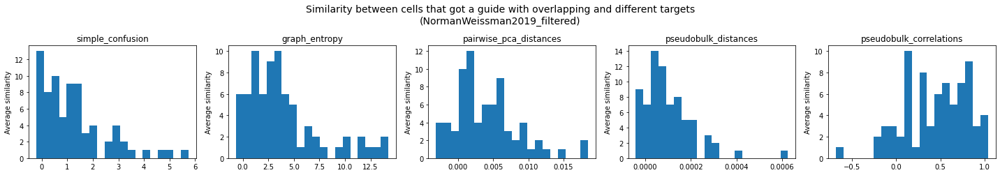

In [92]:
fig, axs = pl.subplots(1,5, figsize=[4*5, 3])
tabs = {}
SDIR = "/fast/scratch/users/peidlis_c/perturbation_resource_paper/"
for ax, mode in zip(axs, modes):
    sim = pd.read_csv(f'./analysis_screens/tables/{mode}_NormanWeissman2019_filtered_tables.csv', index_col=0)
    # we do have dups! Are they more similar to each?
    targets = [y for x in sim.columns for y in x.split('_')]
    # print(f'Found {len(sim) - len(pd.unique(targets))} duplicate targets.')
    perts, cts = np.unique(targets, return_counts=True)
    dups = perts[cts>1]
    
    # dict of guides : [guides with at least one same target]
    A = {}
    for t in targets:
        A[t] = list(sim.columns[[t in c for c in sim.columns]])

    # Average similarity across guides with same target vs different target
    tab = pd.DataFrame(index=perts, columns=['same', 'different'])
    for t in targets:
        a = A[t]  # list of guides with overlapping targets
        X_same = sim.loc[a, a].values  # submatriks for this list onli
        tab.loc[t, 'same'] = np.sum(X_same-np.diag(np.diag(X_same))) / (len(a)**2 - len(a))  # mean of these similarities without diagonal
        X_different = sim.loc[~np.isin(sim.index, a), np.isin(sim.index, a)].values  # submatriks for these with all other
#         X_different = sim.loc[~np.isin(sim.index, a), ~np.isin(sim.index, a)].values  # submatriks for all other among them
        tab.loc[t, 'different'] = np.mean(X_different)  # mean of these sims without diagonal
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
    tabs[mode] = tab
#     ax.bar([0,1], [np.mean(tab.same), np.mean(tab.different)], yerr=[np.std(tab.same), np.std(tab.different)])
    ax.hist(tab.same - tab.different, bins=20)
    ax.set_ylabel(f'Average similarity')
    #ax.set_xticks([0,1])
    #ax.set_xticklabels(['overlapping target', 'different target'])
    ax.set_title(mode)
pl.tight_layout()
pl.suptitle('Similarity between cells that got a guide with overlapping and different targets\n(NormanWeissman2019_filtered)', 
            y=1.15, fontsize=14)
pl.show()

In [140]:
df = pd.DataFrame(index=tabs[modes[0]].index, columns=modes)
for mode, tab in tabs.items():
    df[mode] = tab.same.values - tab.different.values
clear_df = df[np.all(~pd.isna(df).values, axis=1)]

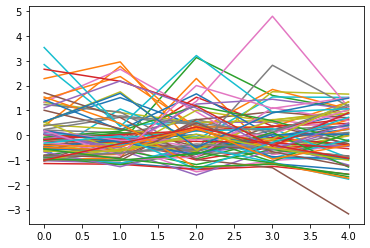

In [141]:
X = zscore(np.array(clear_df.values, dtype=float), axis=0)
adf = pd.DataFrame(X, clear_df.index, clear_df.columns)
for g in adf.index:
    x = adf.loc[g]
    pl.plot(np.arange(len(x)), x)

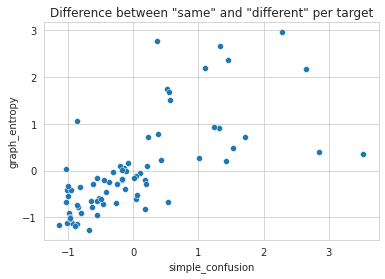

In [156]:
with sns.axes_style('whitegrid'): sns.scatterplot(data=adf, x=modes[0], y=modes[1])
pl.title('Difference between "same" and "different" per target')
pl.show()

<AxesSubplot:>

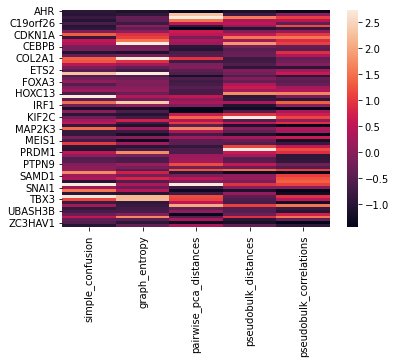

In [119]:
sns.heatmap(adf, robust=True)

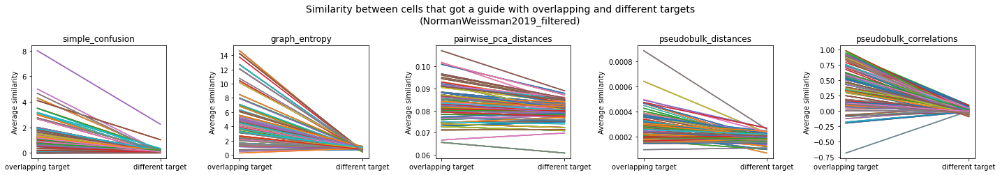

In [69]:
fig, axs = pl.subplots(1,5, figsize=[4*5, 3])
tabs = {}
SDIR = "/fast/scratch/users/peidlis_c/perturbation_resource_paper/"
for ax, mode in zip(axs, modes):
    sim = pd.read_csv(f'./analysis_screens/tables/{mode}_NormanWeissman2019_filtered_tables.csv', index_col=0)
    # we do have dups! Are they more similar to each?
    targets = [y for x in sim.columns for y in x.split('_')]
    # print(f'Found {len(sim) - len(pd.unique(targets))} duplicate targets.')
    perts, cts = np.unique(targets, return_counts=True)
    dups = perts[cts>1]
    
    # dict of guides : [guides with at least one same target]
    A = {}
    for t in targets:
        A[t] = list(sim.columns[[t in c for c in sim.columns]])

    # Average similarity across guides with same target vs different target
    tab = pd.DataFrame(index=targets, columns=['same', 'different'])
    for t in targets:
        a = A[t]  # list of guides with overlapping targets
        X_same = sim.loc[a, a].values  # submatriks for this list onli
        tab.loc[t, 'same'] = np.sum(X_same-np.diag(np.diag(X_same))) / (len(a)**2 - len(a))  # mean of these similarities without diagonal
        X_different = sim.loc[~np.isin(sim.index, a), np.isin(sim.index, a)].values  # submatriks for these with all other
#         X_different = sim.loc[~np.isin(sim.index, a), ~np.isin(sim.index, a)].values  # submatriks for all other among them
        tab.loc[t, 'different'] = np.mean(X_different)  # mean of these sims without diagonal
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
    tabs[mode] = tab
#     ax.bar([0,1], [np.mean(tab.same), np.mean(tab.different)], yerr=[np.std(tab.same), np.std(tab.different)])
    for s, d in zip(tab.same, tab.different):
        ax.plot([0,1], [s,d])
    ax.set_ylabel(f'Average similarity')
    ax.set_xticks([0,1])
    ax.set_xticklabels(['overlapping target', 'different target'])
    ax.set_title(mode)
pl.tight_layout()
pl.suptitle('Similarity between cells that got a guide with overlapping and different targets\n(NormanWeissman2019_filtered)', 
            y=1.15, fontsize=14)
pl.show()

In [70]:
tab

,same,different
HOXB9,0.560278,-0.019394
FOXL2,0.535468,-0.007453
MEIS1,0.052365,0.033779
CEBPE,0.321854,0.029163
SPI1,-0.182749,-0.012655
...,...,...
UBASH3A,0.109007,-0.034242
DUSP9,0.433679,-0.00321
KLF1,0.467349,-0.016211
PTPN12,0.124231,-0.009777


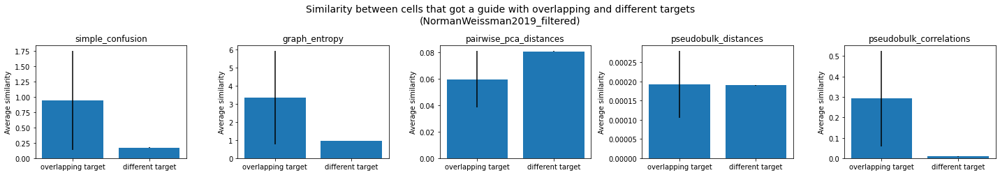

In [59]:
fig, axs = pl.subplots(1,5, figsize=[4*5, 3])
tabs = {}
SDIR = "/fast/scratch/users/peidlis_c/perturbation_resource_paper/"
for ax, mode in zip(axs, modes):
    sim = pd.read_csv(f'./analysis_screens/tables/{mode}_NormanWeissman2019_filtered_tables.csv', index_col=0)
    # we do have dups! Are they more similar to each?
    targets = [y for x in sim.columns for y in x.split('_')]
    # print(f'Found {len(sim) - len(pd.unique(targets))} duplicate targets.')
    perts, cts = np.unique(targets, return_counts=True)
    dups = perts[cts>1]
    
    # dict of guides : [guides with at least one same target]
    A = {}
    for t in targets:
        A[t] = list(sim.columns[[t in c for c in sim.columns]])

    # Average similarity across guides with same target vs different target
    tab = pd.DataFrame(index=targets, columns=['same', 'different'])
    for t in targets:
        a = A[t]  # list of guides with overlapping targets
        X_same = sim.loc[a, a].values  # submatriks for this list onli
        tab.loc[t, 'same'] = np.mean(X_same-np.diag(np.diag(X_same)))  # mean of these similarities without diagonal
        X_different = sim.loc[~np.isin(sim.index, a), ~np.isin(sim.index, a)].values  # submatriks for these with all other
#         X_different = sim.loc[~np.isin(sim.index, a), ~np.isin(sim.index, a)].values  # submatriks for all other among them
        tab.loc[t, 'different'] = np.mean(X_different-np.diag(np.diag(X_different)))  # mean of these sims without diagonal
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
    tabs[mode] = tab
    ax.bar([0,1], [np.mean(tab.same), np.mean(tab.different)], yerr=[np.std(tab.same), np.std(tab.different)])
    ax.set_ylabel(f'Average similarity')
    ax.set_xticks([0,1])
    ax.set_xticklabels(['overlapping target', 'different target'])
    ax.set_title(mode)
pl.tight_layout()
pl.suptitle('Similarity between cells that got a guide with overlapping and different targets\n(NormanWeissman2019_filtered)', 
            y=1.15, fontsize=14)
pl.show()

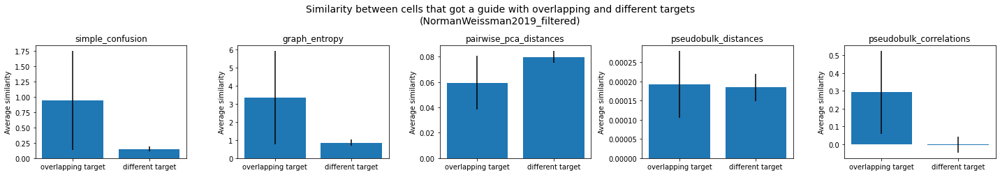

In [60]:
fig, axs = pl.subplots(1,5, figsize=[4*5, 3])
tabs = {}
SDIR = "/fast/scratch/users/peidlis_c/perturbation_resource_paper/"
for ax, mode in zip(axs, modes):
    sim = pd.read_csv(f'./analysis_screens/tables/{mode}_NormanWeissman2019_filtered_tables.csv', index_col=0)
    # we do have dups! Are they more similar to each?
    targets = [y for x in sim.columns for y in x.split('_')]
    # print(f'Found {len(sim) - len(pd.unique(targets))} duplicate targets.')
    perts, cts = np.unique(targets, return_counts=True)
    dups = perts[cts>1]
    
    # dict of guides : [guides with at least one same target]
    A = {}
    for t in targets:
        A[t] = list(sim.columns[[t in c for c in sim.columns]])

    # Average similarity across guides with same target vs different target
    tab = pd.DataFrame(index=targets, columns=['same', 'different'])
    for t in targets:
        a = A[t]  # list of guides with overlapping targets
        X_same = sim.loc[a, a].values  # submatriks for this list onli
        tab.loc[t, 'same'] = np.mean(X_same-np.diag(np.diag(X_same)))  # mean of these similarities without diagonal
        X_different = sim.loc[np.isin(sim.index, a), ~np.isin(sim.index, a)].values  # submatriks for these with all other
#         X_different = sim.loc[~np.isin(sim.index, a), ~np.isin(sim.index, a)].values  # submatriks for all other among them
        tab.loc[t, 'different'] = np.mean(X_different)  # mean of these sims without diagonal
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
    tabs[mode] = tab
    ax.bar([0,1], [np.mean(tab.same), np.mean(tab.different)], yerr=[np.std(tab.same), np.std(tab.different)])
    ax.set_ylabel(f'Average similarity')
    ax.set_xticks([0,1])
    ax.set_xticklabels(['overlapping target', 'different target'])
    ax.set_title(mode)
pl.tight_layout()
pl.suptitle('Similarity between cells that got a guide with overlapping and different targets\n(NormanWeissman2019_filtered)', 
            y=1.15, fontsize=14)
pl.show()

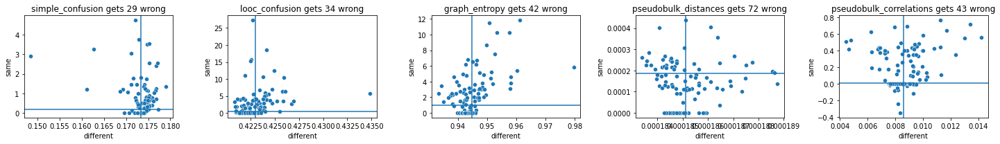

In [61]:
fig, axs = pl.subplots(1,5, figsize=[4*5, 3])
for ax, mode in zip(axs, modes):
    tab = tabs[mode]
    tab = tab.drop_duplicates()
    sns.scatterplot(data=tab, y='same', x='different', ax=ax)
    k = np.mean(tab.different.values)
    ax.axhline(k)
    ax.axvline(k)
    less_sim = len(tab[tab.same<tab.different])
    ax.set_title(f'{mode} gets {less_sim} wrong')
pl.tight_layout()
pl.show()

# Similarity of guides with same target

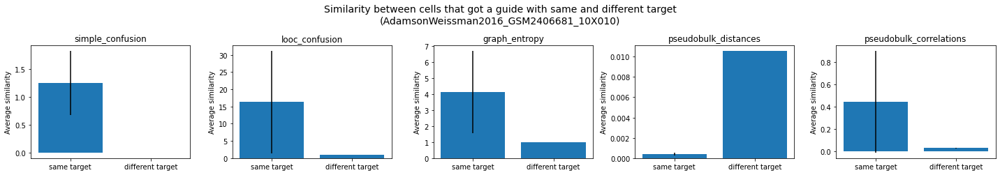

In [75]:
N = len(modes)
fig, axs = pl.subplots(1,N,figsize=[4*N, 3])
tabs = {}
for ax, mode in zip(axs, modes):
    sim = pd.read_csv(f'./analysis_screens/tables/{mode}_AdamsonWeissman2016_GSM2406681_10X010_tables.csv', index_col=0)
    # we do have dups! Are they more similar to each?
    targets = [x.split('_')[0] for x in sim.columns]
    # print(f'Found {len(sim) - len(pd.unique(targets))} duplicate targets.')
    perts, cts = np.unique(targets, return_counts=True)
    dups = perts[cts>1]
    
    # dict of guides : [guides with at least one same target]
    A = {}
    for t in targets:
        A[t] = list(sim.columns[[t in c for c in sim.columns]])

    # Average similarity across guides with same target vs different target
    # dict of duplicate targets : [guides]
    A = {}
    for dup in dups:
        A[dup] = [x for x in sim.columns if dup+'_pDS' in x]  

    # Average similarity across guides with same target vs different target
    tab = pd.DataFrame(index=dups, columns=['same', 'different'])
    for dup in dups:
        g1, g2 = A[dup]
        tab.loc[dup, 'same'] = sim.loc[g1, g2]
        tab.loc[dup, 'different'] = np.mean(sim.loc[sim.index!=g1, sim.columns!=g2].values)
    
    tabs[mode] = tab
        
    ax.bar([0,1], [np.mean(tab.same), np.mean(tab.different)], yerr=[np.std(tab.same), np.std(tab.different)])
    ax.set_ylabel(f'Average similarity')
    ax.set_xticks([0,1])
    ax.set_xticklabels(['same target', 'different target'])
    ax.set_title(mode)
pl.tight_layout()
pl.suptitle('Similarity between cells that got a guide with same and different target\n(AdamsonWeissman2016_GSM2406681_10X010)', 
            y=1.15, fontsize=14)
pl.show()

In [ ]:
N = len(modes)
fig, axs = pl.subplots(1,N,figsize=[4*N, 3])
tabs = {}
for ax, mode in zip(axs, modes):
    sim = pd.read_csv(f'./analysis_screens/tables/{mode}_AdamsonWeissman2016_GSM2406681_10X010_tables.csv', index_col=0)
    # we do have dups! Are they more similar to each?
    targets = [x.split('_')[0] for x in sim.columns]
    # print(f'Found {len(sim) - len(pd.unique(targets))} duplicate targets.')
    perts, cts = np.unique(targets, return_counts=True)
    dups = perts[cts>1]
    
    # dict of guides : [guides with at least one same target]
    A = {}
    for t in targets:
        A[t] = list(sim.columns[[t in c for c in sim.columns]])

    # Average similarity across guides with same target vs different target
    # dict of duplicate targets : [guides]
    A = {}
    for dup in dups:
        A[dup] = [x for x in sim.columns if dup+'_pDS' in x]  

    # Average similarity across guides with same target vs different target
    tab = pd.DataFrame(index=dups, columns=['same', 'different'])
    for dup in dups:
        g1, g2 = A[dup]
        tab.loc[dup, 'same'] = sim.loc[g1, g2]
        tab.loc[dup, 'different'] = np.mean(sim.loc[sim.index!=g1, sim.columns!=g2].values)
    
    tabs[mode] = tab
        
    ax.bar([0,1], [np.mean(tab.same), np.mean(tab.different)], yerr=[np.std(tab.same), np.std(tab.different)])
    ax.set_ylabel(f'Average similarity')
    ax.set_xticks([0,1])
    ax.set_xticklabels(['same target', 'different target'])
    ax.set_title(mode)
pl.tight_layout()
pl.suptitle('Similarity between cells that got a guide with same and different target\n(AdamsonWeissman2016_GSM2406681_10X010)', 
            y=1.15, fontsize=14)
pl.show()

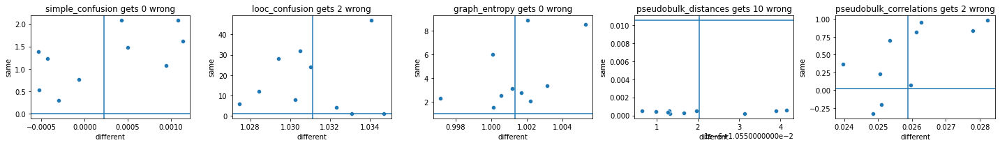

In [77]:
fig, axs = pl.subplots(1,5, figsize=[4*5, 3])
for ax, mode in zip(axs, modes):
    tab = tabs[mode]
    tab = tab.drop_duplicates()
    sns.scatterplot(data=tab, y='same', x='different', ax=ax)
    k = np.mean(tab.different.values)
    ax.axhline(k)
    ax.axvline(k)
    less_sim = len(tab[tab.same<tab.different])
    ax.set_title(f'{mode} gets {less_sim} wrong')
pl.tight_layout()
pl.show()

In [ ]:
# rerun simple classifier (additional rule), propagate test only
# Compare confusion for split classes (or same guides) not against confusion with all other but with confusion of class with itself
# With using propagate test only, this will also make sense for the classifier --> unbiased confusion